# Self-Driving Car Engineer Nanodegree

## Project: Advanced Lane Finding

***

Note: Throughout this project, I will be following a style convention to keep the code clear.

Functions starting with a `_` are not meant to be re-used, but are used as procedures to limit the scope of created variables. 

Functions not starting with a `_` are meant to be reusable.

Global variables will all be capitalized.

## Import Packages

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

import os

## General Helper Methods for Getting and Displaying Images

In [2]:
def get_images(image_folder_path, get_file_names=False):
    '''Gets a list of images from the given directory'''
    images = []
    file_names = os.listdir(image_folder_path)
    file_names.sort()
    for file_name in file_names:
        if file_name.split('.')[-1] == 'jpg':
            images.append(mpimg.imread('{}/{}'.format(image_folder_path, file_name)))
                              
    if get_file_names:
        return images, file_names

    return images

def display_images(images, names, cmap=None):
    '''Display images in subplot format'''
    assert(len(images) == len(names))

    fig, axs = plt.subplots(int((len(images)+1)/2), 2, figsize=(10, len(images) * 1.5))
    fig.tight_layout()

    for i in range(len(images)):
        image = images[i]
        image_name = names[i]
        axs[int(i/2)][i%2].imshow(image, cmap=cmap) 
        axs[int(i/2)][i%2].set_title('{}'.format(image_name))
        
def display_two_image_lists(images1, images2, names, cmap=None):
    '''Display images pairs in subplot format'''
    assert(len(images1) == len(names))
    assert(len(images2) == len(names))

    new_images = []
    new_names = []
    for i in range(len(images1)):
        new_images.append(images1[i])
        new_images.append(images2[i])
        new_names.append(names[i])
        new_names.append(names[i])
    display_images(new_images, new_names, cmap)

## General Helper Methods for Transforming Images

In [3]:
def rgb_to_grayscale(rgb_image):
    '''Return grayscale version of image. Assumes RGB image (from mpimg read, not cv2)'''
    return cv2.cvtColor(rgb_image, cv2.COLOR_RGB2GRAY)

def rgb_to_r(rgb_image):
    '''Return red channel of image. Assumes RGB image (from mpimg read, not cv2)'''
    return rgb_image[:, :, 0]

def rgb_to_g(rgb_image):
    '''Return green channel of image. Assumes RGB image (from mpimg read, not cv2)'''
    return rgb_image[:, :, 1]

def rgb_to_b(rgb_image):
    '''Return blue channel of image. Assumes RGB image (from mpimg read, not cv2)'''
    return rgb_image[:, :, 2]

def rgb_to_h(rgb_image):
    '''Return hue channel of the image in HLS. Assumes RGB image (from mpimg read, not cv2)'''
    hls_image = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2HLS)
    return hls_image[:, :, 0]

def rgb_to_l(rgb_image):
    '''Return luminance channel of the image in HLS. Assumes RGB image (from mpimg read, not cv2)'''
    hls_image = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2HLS)
    return hls_image[:, :, 1]

def rgb_to_s(rgb_image):
    '''Return saturation channel of the image in HLS. Assumes RGB image (from mpimg read, not cv2)'''
    hls_image = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2HLS)
    return hls_image[:, :, 2]

## Camera Calibration

### Helper Methods

In [4]:
def find_chessboard_corners(gray, n_inside_corners_x, n_inside_corners_y):
    '''Returns corners of gray image'''
    ret, corners = cv2.findChessboardCorners(gray, (n_inside_corners_x, n_inside_corners_y))
    if not ret:
        print("WARNING: Could not find corners")
    return corners

def get_corners_image(image, corners, n_inside_corners_x, n_inside_corners_y):
    '''Draw corners on image'''
    copied_image = image.copy()
    return cv2.drawChessboardCorners(copied_image, (n_inside_corners_x, n_inside_corners_y), corners, True)

def get_obj_points(n_inside_corners_x, n_inside_corners_y):
    '''Get the object points of this image'''
    obj_points = np.zeros((n_inside_corners_x*n_inside_corners_y, 3), np.float32)
    obj_points[:,:2] = np.mgrid[0:n_inside_corners_x,0:n_inside_corners_y].T.reshape(-1,2)
    return obj_points

def get_camera_matrix_and_distortion_matrix(image, object_points, image_points):
    '''Get the camera and distoration matrices based on object points and image points'''
    gray = rgb_to_grayscale(image)
    _, mtx, dist, _, _ = cv2.calibrateCamera(object_points, image_points, gray.shape[::-1], None, None)
    return mtx, dist

def undistort(image, mtx, dist):
    '''Undistort image based on camera and distortion matrices'''
    return cv2.undistort(image, mtx, dist)

### Main Code

In [5]:
# Constants across chessboards
N_INSIDE_CORNERS_X = 9
N_INSIDE_CORNERS_Y = 6
CALIBRATION_IMAGES, CALIBRATION_IMAGE_FILE_NAMES = get_images('./camera_cal', get_file_names=True)

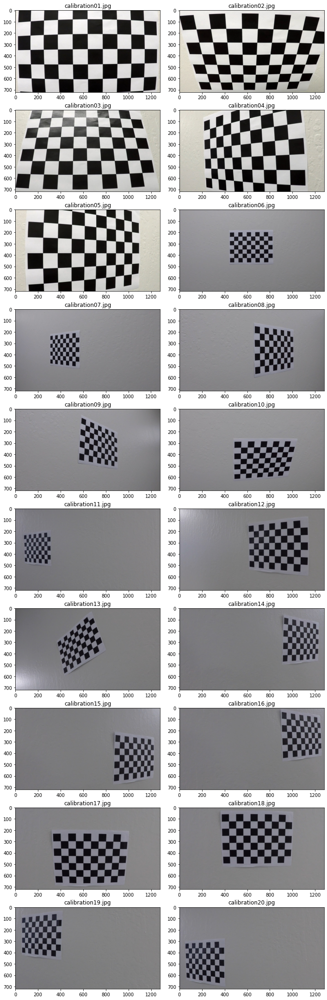

In [6]:
# Read in calibration images and display them
def _display_calibration_images():
    display_images(CALIBRATION_IMAGES, CALIBRATION_IMAGE_FILE_NAMES)
    
_display_calibration_images()

In [7]:
def _find_obj_points_and_img_points():
    # Find corners in chessboard images
    print("Finding corners in calibration images. Assuming N_INSIDE_CORNERS_X = {}. N_INSIDE_CORNERS_Y = {}".format(N_INSIDE_CORNERS_X, N_INSIDE_CORNERS_Y))
    print()

    all_obj_points = []
    all_img_points = []

    num_valid_images = 0
    invalid_image_indices = []
    for i, calibration_image in enumerate(CALIBRATION_IMAGES):
        # Find corners
        obj_points = get_obj_points(N_INSIDE_CORNERS_X, N_INSIDE_CORNERS_Y)
        corners = find_chessboard_corners(rgb_to_grayscale(calibration_image), N_INSIDE_CORNERS_X, N_INSIDE_CORNERS_Y)

        # Skip images in which corners could not be found    
        if corners is None or obj_points.shape[0] != corners.shape[0]:
            print("Invalid image found at index {}. Skipping.".format(i))
            invalid_image_indices.append(i)
            continue
        
        # Store points
        num_valid_images += 1
        all_obj_points.append(obj_points)
        all_img_points.append(corners)

    # Output message
    print()
    print("Corners successfully found in {}/{} images.".format(num_valid_images, len(CALIBRATION_IMAGES)))
    
    return all_obj_points, all_img_points, invalid_image_indices

ALL_OBJ_POINTS, ALL_IMG_POINTS, INVALID_IMG_INDICES = _find_obj_points_and_img_points()

Finding corners in calibration images. Assuming N_INSIDE_CORNERS_X = 9. N_INSIDE_CORNERS_Y = 6

Invalid image found at index 0. Skipping.
Invalid image found at index 3. Skipping.
Invalid image found at index 4. Skipping.

Corners successfully found in 17/20 images.


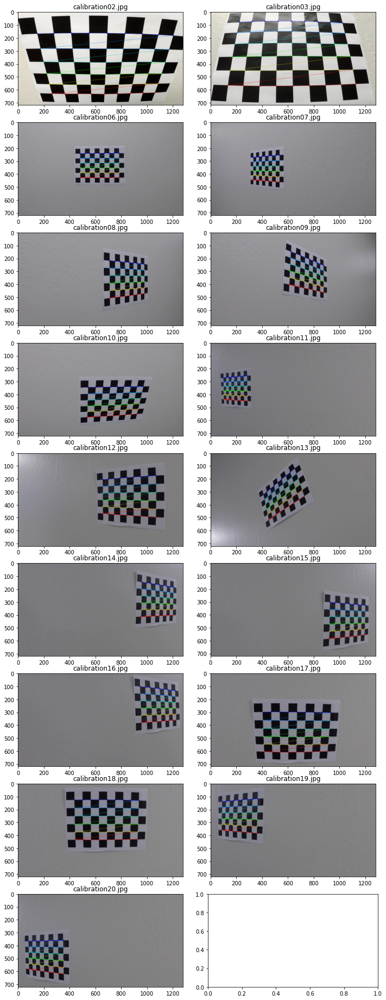

In [8]:
# Display chessboard images with corners
def _get_corner_images(invalid_image_indices, corners_list):
    # Helper method used later
    import copy
    calibration_images, calibration_image_file_names = copy.deepcopy(CALIBRATION_IMAGES), copy.copy(CALIBRATION_IMAGE_FILE_NAMES)
    
    # Remove invalid
    for invalid_image_index in reversed(invalid_image_indices):
        calibration_image_file_names.pop(invalid_image_index)
        calibration_images.pop(invalid_image_index)

    # Add corners to images
    corner_images = []
    for i in range(len(corners_list)):
        corners = corners_list[i]
        img = calibration_images[i]
        corner_images.append(get_corners_image(img, corners, N_INSIDE_CORNERS_X, N_INSIDE_CORNERS_Y))
    
    return corner_images, calibration_image_file_names

def _display_corner_images(invalid_image_indices, corners_list):
    corner_images, corner_names = _get_corner_images(invalid_image_indices, corners_list)
    
    # Display images
    display_images(corner_images, corner_names)
    
_display_corner_images(INVALID_IMG_INDICES, ALL_IMG_POINTS)

In [9]:
# Calculate camera matrix and distortion matrix
CAMERA_MATRIX, DISTORTION_MATRIX = get_camera_matrix_and_distortion_matrix(CALIBRATION_IMAGES[0], ALL_OBJ_POINTS, ALL_IMG_POINTS)
print("CAMERA_MATRIX = \n{}".format(CAMERA_MATRIX))
print()
print("DISTORTION_MATRIX = \n{}".format(DISTORTION_MATRIX))

CAMERA_MATRIX = 
[[1.15777829e+03 0.00000000e+00 6.67113868e+02]
 [0.00000000e+00 1.15282230e+03 3.86124656e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]

DISTORTION_MATRIX = 
[[-0.24688571 -0.02372833 -0.00109832  0.00035104 -0.00260415]]


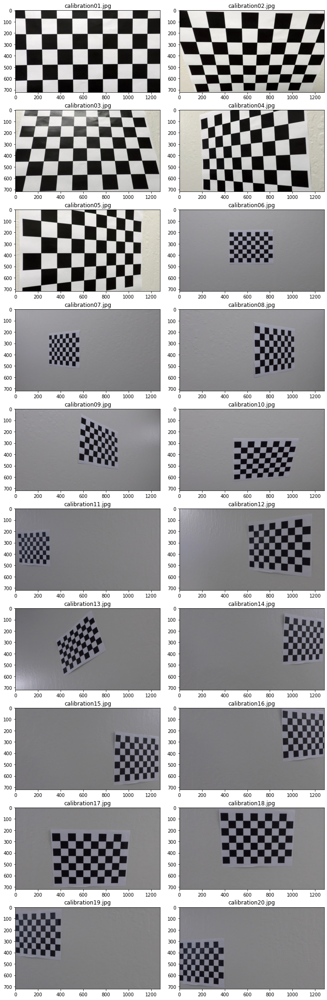

In [10]:
# Display undistorted chessboard images
def _display_undistorted_images(camera_matrix, distortion_matrix):
    import copy
    calibration_images, calibration_image_file_names = copy.deepcopy(CALIBRATION_IMAGES), copy.copy(CALIBRATION_IMAGE_FILE_NAMES)

    undistorted_calibration_images = [undistort(img, camera_matrix, distortion_matrix) for img in calibration_images]
    display_images(undistorted_calibration_images, calibration_image_file_names)
    
_display_undistorted_images(CAMERA_MATRIX, DISTORTION_MATRIX)

## Perspective Transform

In [11]:
def helper_perspective_transform(image_shape, corners, top_border, bottom_border, left_border, right_border):
    width, height = image_shape
    src = np.float32([corners[0],
                      corners[1],
                      corners[2],
                      corners[3]])
    
    dest = np.float32([[left_border*width, top_border*height],
                       [(1-right_border)*width, top_border*height],
                       [left_border*width, (1-bottom_border)*height],
                       [(1-right_border)*width, (1-bottom_border)*height]])
    
    return src, dest
    
def perspective_transform(image, corners, top_border=1/6, bottom_border=1/6, left_border=1/6, right_border=1/6, return_M=False):
    '''Warps image using the four corners.
    
    corners is a list of pairs which represent the corners [ul, ur, ll, lr]
    ul = upper left
    ur = upper right
    ll = lower left
    lr = lower right
    '''
    height, width = image.shape[0], image.shape[1]
    image_shape = (width, height)

    src, dest = helper_perspective_transform(image_shape, corners, top_border, bottom_border, left_border, right_border)

    M = cv2.getPerspectiveTransform(src, dest)
    perspective_image = cv2.warpPerspective(image, M, image_shape, flags=cv2.INTER_LINEAR)
    
    if return_M:
        return perspective_image, M
    return perspective_image

def inverse_perspective_transform(image, corners, top_border=1/6, bottom_border=1/6, left_border=1/6, right_border=1/6, return_M=False):
    '''Inverse warps image using the four corners
    
    corners is a list of pairs which represent the corners [ul, ur, ll, lr]
    ul = upper left
    ur = upper right
    ll = lower left
    lr = lower right
    '''
    height, width = image.shape[0], image.shape[1]
    image_shape = (width, height)

    src, dest = helper_perspective_transform(image_shape, corners, top_border, bottom_border, left_border, right_border)

    M = cv2.getPerspectiveTransform(dest, src)
    perspective_image = cv2.warpPerspective(image, M, image_shape, flags=cv2.INTER_LINEAR)
    
    if return_M:
        return perspective_image, M
    return perspective_image

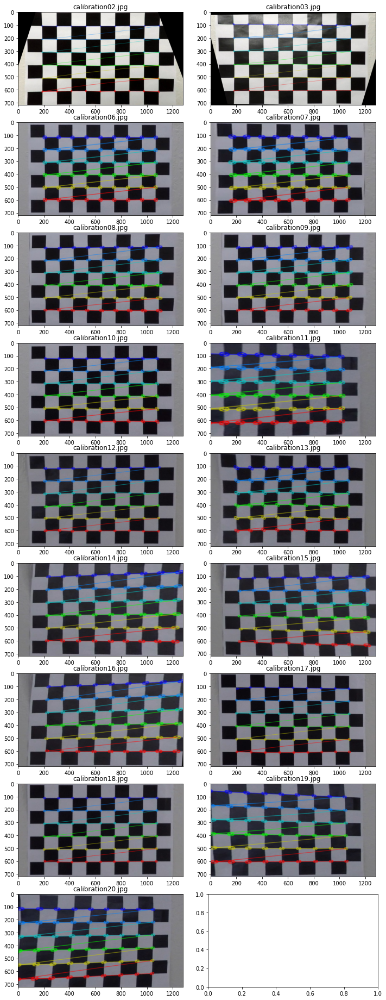

In [12]:
# Display chessboard images birds-eye view
def _display_perspective_images(invalid_image_indices, corners_list):
    perspective_images, perspective_names = _get_corner_images(invalid_image_indices, corners_list)

    four_corners_list = [[corners[0],
                          corners[N_INSIDE_CORNERS_X-1],
                          corners[N_INSIDE_CORNERS_X*(N_INSIDE_CORNERS_Y-1)],
                          corners[N_INSIDE_CORNERS_X*N_INSIDE_CORNERS_Y-1]]
                         for corners in ALL_IMG_POINTS]
    perspective_images = [undistort(img, CAMERA_MATRIX, DISTORTION_MATRIX) for img in perspective_images]
    perspective_images = [perspective_transform(perspective_images[i], four_corners_list[i]) for i in range(len(perspective_images))]
    display_images(perspective_images, perspective_names)

_display_perspective_images(INVALID_IMG_INDICES, ALL_IMG_POINTS)

## Read in Lane Line Images

In [13]:
# Read in lane line images
LANE_LINE_IMAGES, LANE_LINE_IMAGE_FILE_NAMES = get_images('./test_images', get_file_names=True)

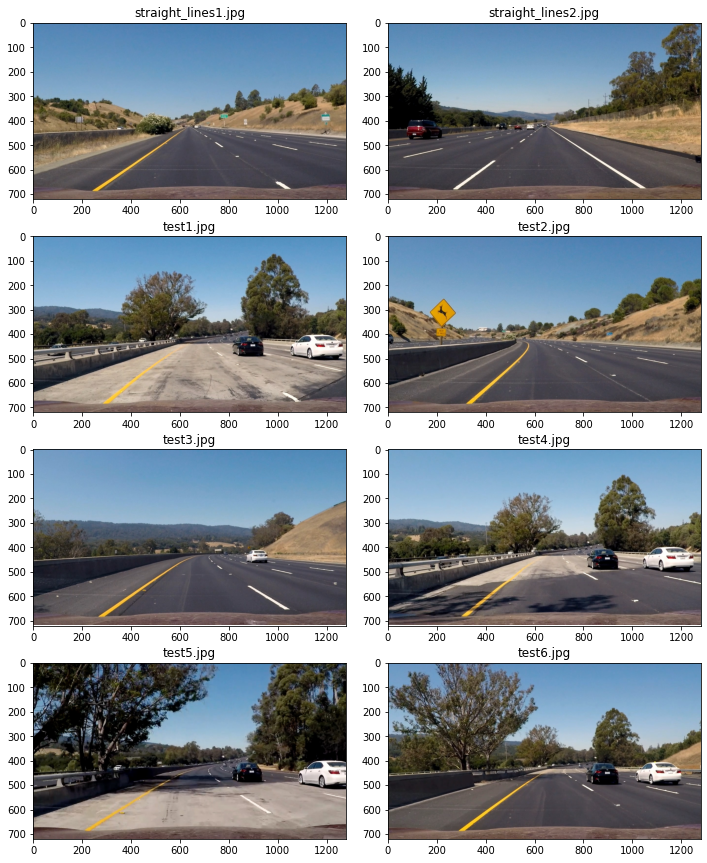

In [14]:
# Display lane line images
display_images(LANE_LINE_IMAGES, LANE_LINE_IMAGE_FILE_NAMES)

## Road Perspective Transform

### Select Corners for Road Perspective Transform

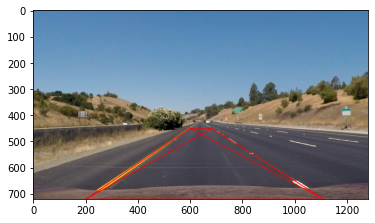

In [15]:
def _create_road_corners(image):
    lower_corner_y = 720
    higher_corner_y = 450
    lane_line_corners = [(599, higher_corner_y),  # Upper left
                         (682, higher_corner_y),  # Upper right 
                         (202, lower_corner_y),   # Lower left
                         (1110, lower_corner_y)]  # Lower right
                         
    return lane_line_corners

def _draw_lane_line_corners(image, corners, radius=1, color=(255, 0, 0), thickness=2, draw_lines=False):
    annotated_image = image.copy()
    
    # Draw circles
    for corner in corners:
        annotated_image = cv2.circle(annotated_image, corner, radius, color, thickness)
        
    # Draw lines between circles
    if draw_lines:
        for i, corneri in enumerate(corners):
            for j, cornerj in enumerate(corners):
                annotated_image = cv2.line(annotated_image, corneri, cornerj, color, thickness)

    return annotated_image

LANE_LINE_CORNERS = _create_road_corners(LANE_LINE_IMAGES[0])
plt.imshow(_draw_lane_line_corners(LANE_LINE_IMAGES[0], LANE_LINE_CORNERS, draw_lines=True))

In [16]:
def undistort_and_perspective(image):
    undistorted = undistort(image, CAMERA_MATRIX, DISTORTION_MATRIX)
    return perspective_transform(undistorted, LANE_LINE_CORNERS, bottom_border=0, left_border=1/4, right_border=1/4, top_border=0)

def inverse_perspective(image):
    return inverse_perspective_transform(image, LANE_LINE_CORNERS, bottom_border=0, left_border=1/4, right_border=1/4, top_border=0)

### Visualize perspective transform

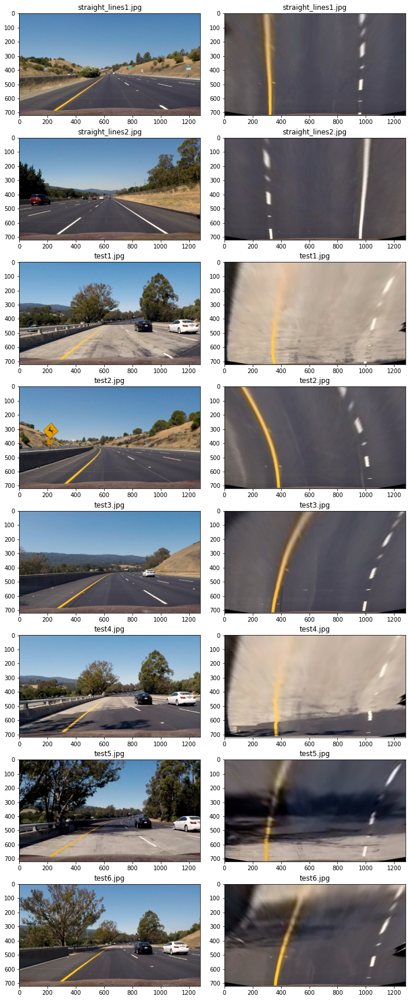

In [17]:
def _display_perspective_transform():
    fixed_images = [undistort_and_perspective(img) for img in LANE_LINE_IMAGES]
    display_two_image_lists(LANE_LINE_IMAGES, fixed_images, LANE_LINE_IMAGE_FILE_NAMES)

_display_perspective_transform()

## Thresholded Binary Image

### Helper Methods

In [18]:
def channel_thresh(single_channel_image, thresh=(0, 255)):
    # Create binary output, where pixels are set to 1 when the value is within the threshold
    thresh_min, thresh_max = thresh
    binary_output = np.zeros_like(single_channel_image)
    binary_output[(single_channel_image > thresh_min) & (single_channel_image < thresh_max)] = 1
    return binary_output
    
def abs_sobel_thresh(single_channel_image, orient=[1,0], thresh=(0, 255)):
    '''x is [1, 0]. y is [0, 1]'''
    # 1) Ensure that input image is single channel
    assert(len(single_channel_image.shape) == 2)
    
    # 2) Take derivative in given orientation
    sobel = cv2.Sobel(single_channel_image, cv2.CV_64F, orient[0], orient[1])
    
    # 3) Take absolute value of gradient
    abs_sobel = np.absolute(sobel)
    
    # 4) Scale to 8 bit integer
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    
    # 5) Create mask of 1's where the magnitude is within thresholds
    thresh_min, thresh_max = thresh
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel > thresh_min) & (scaled_sobel < thresh_max)] = 1
    
    return binary_output

def sobel_mag_thresh(single_channel_image, sobel_kernel=3, mag_thresh=(0, 255)):
    # 1) Ensure that input image is single channel
    assert(len(single_channel_image.shape) == 2)
    
    # 2) Take gradients in x and y
    sobelx = cv2.Sobel(single_channel_image, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(single_channel_image, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Calculate the magnitude
    sobelxy = (sobelx**2 + sobely**2)**0.5
    
    # 4) Scale to 8 bit int
    scaled_sobelxy = np.uint8(255 * sobelxy / np.max(sobelxy))
    
    # 5) Create binary mask where mag thresholds are met
    thresh_min, thresh_max = mag_thresh
    binary_output = np.zeros_like(scaled_sobelxy)
    binary_output[(scaled_sobelxy > thresh_min) & (scaled_sobelxy < thresh_max)] = 1
    
    return binary_output

def sobel_dir_thresh(single_channel_image, sobel_kernel=3, thresh_degrees=(0, 90)):
    # 1) Ensure that input image is single channel
    assert(len(single_channel_image.shape) == 2)
    
    # 2) Take gradient in x and y
    sobelx = cv2.Sobel(single_channel_image, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(single_channel_image, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Take absoluate value of gradient
    sobelxy = (sobelx**2 + sobely**2)**0.5
    
    # 4) Calculate direction
    direction_degrees = np.rad2deg(np.arctan2(np.abs(sobely), np.abs(sobelx)))

    # 5) Create binary mask when thresholds are met
    thresh_min, thresh_max = thresh_degrees
    binary_output = np.zeros_like(sobelxy)
    binary_output[(direction_degrees > thresh_min) & (direction_degrees < thresh_max)] = 1
    
    return binary_output

### Visualize Single-Channel Images

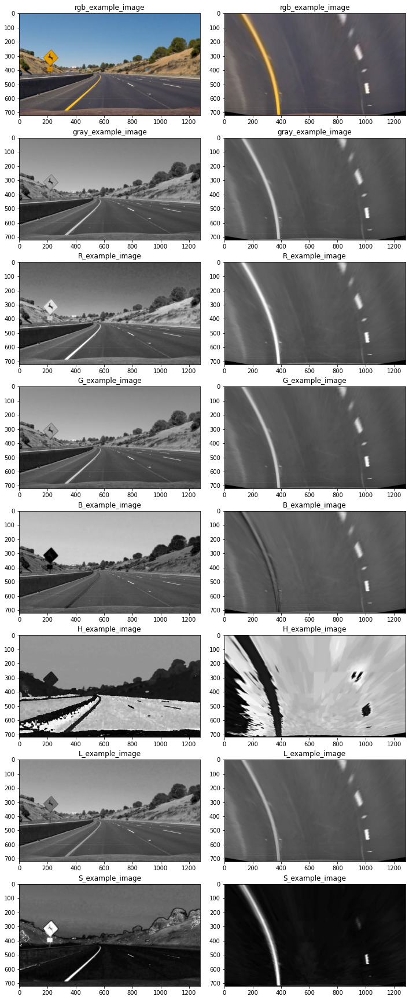

In [19]:
# Start from example image and visualize different single-channel transforms for future binary transforms
def _visualize_single_channel_images():
    rgb_example_image = LANE_LINE_IMAGES[3]

    # Gray
    gray_example_image = rgb_to_grayscale(rgb_example_image)

    # RGB
    R_example_image, G_example_image, B_example_image = rgb_to_r(rgb_example_image), rgb_to_g(rgb_example_image), rgb_to_b(rgb_example_image)

    # HSV
    H_example_image, L_example_image, S_example_image = rgb_to_h(rgb_example_image), rgb_to_l(rgb_example_image), rgb_to_s(rgb_example_image)

    # Show regular and overhead pics
    regular_images = [rgb_example_image, gray_example_image, R_example_image, G_example_image, B_example_image, H_example_image, L_example_image, S_example_image]
    fixed_images = [undistort_and_perspective(img) for img in regular_images]
    regular_names = ['rgb_example_image', 'gray_example_image', 'R_example_image', 'G_example_image', 'B_example_image', 'H_example_image', 'L_example_image', 'S_example_image']
    
    display_two_image_lists(regular_images, fixed_images, regular_names, cmap='gray')

_visualize_single_channel_images()

### Define and Visualize Custom Weighted Single Channel Transform

In [20]:
def rgb_to_custom_weighted_single_channel(rgb_image):
    R_image = rgb_to_r(rgb_image)
    S_image = rgb_to_s(rgb_image)
    return cv2.addWeighted(R_image, 0.25, S_image, 0.75, 0.0)

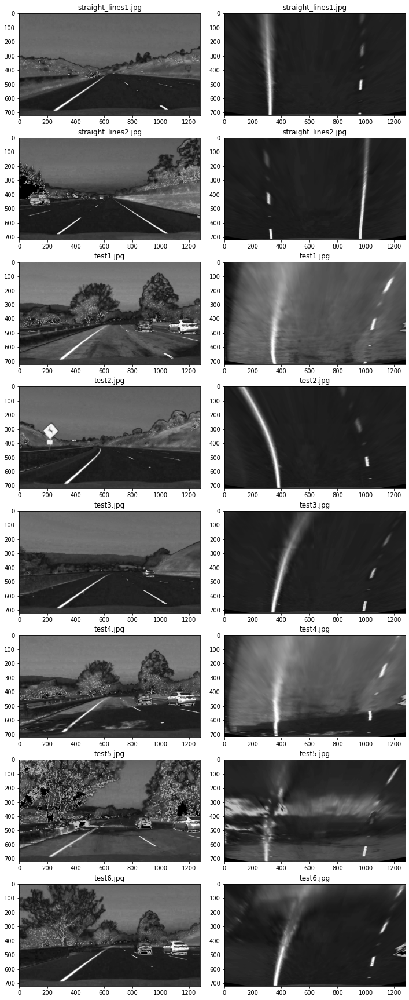

In [21]:
def _visualize_custom_weighted_single_channel():
    single_channel_images = [rgb_to_custom_weighted_single_channel(img) for img in LANE_LINE_IMAGES]
    fixed_images = [undistort_and_perspective(img) for img in single_channel_images]
    display_two_image_lists(single_channel_images, fixed_images, LANE_LINE_IMAGE_FILE_NAMES, cmap='gray')

_visualize_custom_weighted_single_channel()

### Create binary images

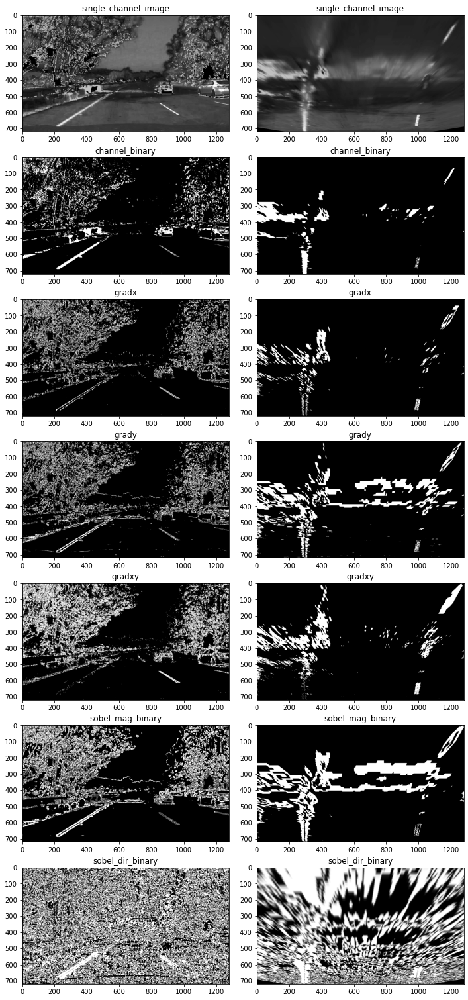

In [22]:
def get_all_thresholdings(single_channel_image):
    channel_binary = channel_thresh(single_channel_image, thresh=[120, 255])
    gradx = abs_sobel_thresh(single_channel_image, orient=[1, 0], thresh=[20, 100])
    grady = abs_sobel_thresh(single_channel_image, orient=[0, 1], thresh=[20, 100])
    gradxy = abs_sobel_thresh(single_channel_image, orient=[1, 1], thresh=[10, 255])
    sobel_mag_binary = sobel_mag_thresh(single_channel_image, sobel_kernel=9, mag_thresh=[30, 100])
    sobel_dir_binary = sobel_dir_thresh(single_channel_image, sobel_kernel=15, thresh_degrees=[30, 80])
    return channel_binary, gradx, grady, gradxy, sobel_mag_binary, sobel_dir_binary

def _visualize_different_thresholding(rgb_image):
    # Make calculations
    single_channel_image = rgb_to_custom_weighted_single_channel(rgb_image)
    channel_binary, gradx, grady, gradxy, sobel_mag_binary, sobel_dir_binary = get_all_thresholdings(single_channel_image)

    orig_images = [single_channel_image, channel_binary, gradx, grady, gradxy, sobel_mag_binary, sobel_dir_binary]
    fixed_images = [undistort_and_perspective(img) for img in orig_images]
    names = ['single_channel_image', 'channel_binary', 'gradx', 'grady', 'gradxy', 'sobel_mag_binary', 'sobel_dir_binary']
    # Display binary images
    display_two_image_lists(orig_images, fixed_images, names, cmap='gray')
    
_visualize_different_thresholding(LANE_LINE_IMAGES[6])

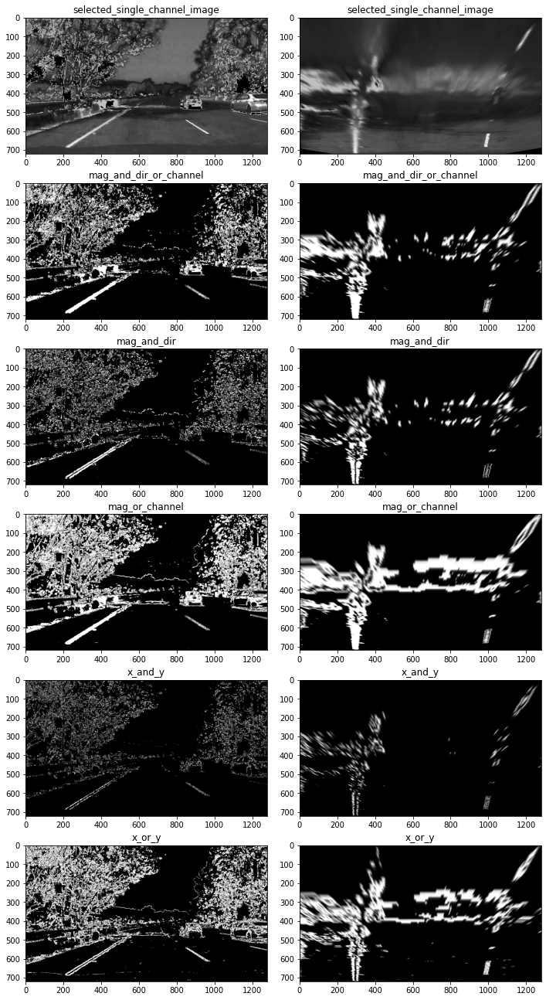

In [23]:
def _visualize_different_combined_thresholding(rgb_image):
    # Make calculations
    selected_single_channel_image = rgb_to_custom_weighted_single_channel(rgb_image)
    channel_binary, gradx, grady, gradxy, sobel_mag_binary, sobel_dir_binary = get_all_thresholdings(selected_single_channel_image)

    # Combine
    mag_and_dir_or_channel = np.zeros_like(sobel_dir_binary)
    mag_and_dir_or_channel[(sobel_mag_binary == 1) & (sobel_dir_binary == 1) | (channel_binary == 1)] = 1
    
    mag_and_dir = np.zeros_like(sobel_dir_binary)
    mag_and_dir[(sobel_mag_binary == 1) & (sobel_dir_binary == 1)] = 1
    
    mag_or_channel = np.zeros_like(sobel_dir_binary)
    mag_or_channel[(sobel_mag_binary == 1) | (channel_binary == 1)] = 1

    x_and_y = np.zeros_like(sobel_dir_binary)
    x_and_y[(gradx == 1) & (grady == 1)] = 1

    x_or_y = np.zeros_like(sobel_dir_binary)
    x_or_y[(gradx == 1) | (grady == 1)] = 1
    
    orig_images = [selected_single_channel_image, mag_and_dir_or_channel, mag_and_dir, mag_or_channel, x_and_y, x_or_y]
    fixed_images = [undistort_and_perspective(img) for img in orig_images]
    names = ['selected_single_channel_image', 'mag_and_dir_or_channel', 'mag_and_dir', 'mag_or_channel', 'x_and_y', 'x_or_y']
    # Display binary images
    display_two_image_lists(orig_images, fixed_images, names, cmap='gray')

_visualize_different_combined_thresholding(LANE_LINE_IMAGES[6])

In [24]:
def single_channel_to_custom_binary(single_channel_image):
#     channel_binary, gradx, grady, gradxy, sobel_mag_binary, sobel_dir_binary = get_all_thresholdings(single_channel_image)
    channel_binary = channel_thresh(single_channel_image, thresh=[120, 255])
    gradx = abs_sobel_thresh(single_channel_image, orient=[1, 0], thresh=[20, 100])

    # Custom
    combined = np.zeros_like(single_channel_image)
    combined[(channel_binary == 1) | (gradx == 1)] = 1
    return combined

def rgb_to_custom_binary(rgb_image):
    single_channel_image = rgb_to_custom_weighted_single_channel(rgb_image)
    return single_channel_to_custom_binary(single_channel_image)

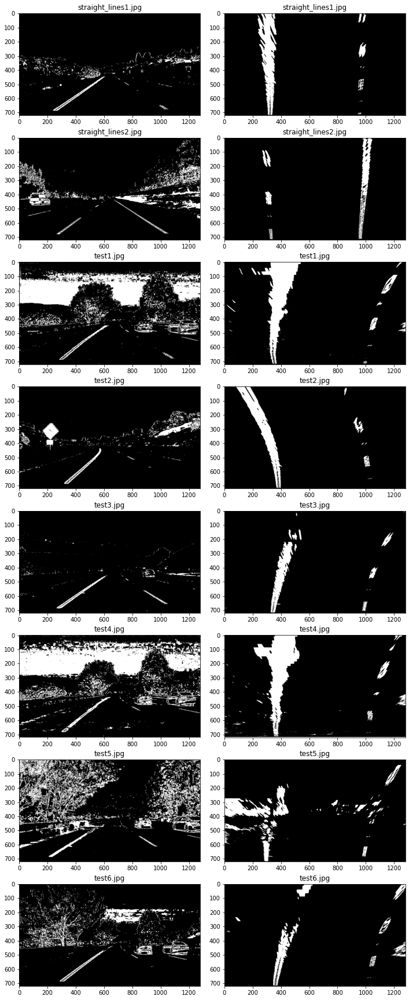

In [25]:
def _display_perspective_transform_binary():
    binary_images = [rgb_to_custom_binary(img) for img in LANE_LINE_IMAGES]
    fixed_images = [undistort_and_perspective(img) for img in binary_images]
    display_two_image_lists(binary_images, fixed_images, LANE_LINE_IMAGE_FILE_NAMES, cmap='gray')

_display_perspective_transform_binary()

In [26]:
def process_image(rgb_image):
    binary_image = rgb_to_custom_binary(rgb_image)
    return undistort_and_perspective(binary_image)

## Identify Line with Sliding Windows

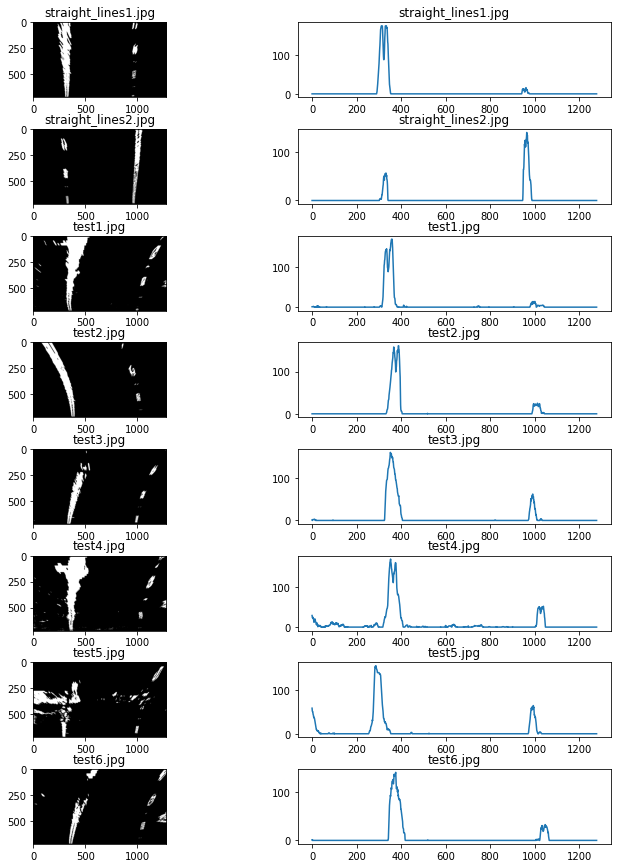

In [27]:
def calculate_histogram(binary_image):
    height, width = binary_image.shape
    bottom_half = binary_image[int(3*height/4):, :]
    return np.sum(bottom_half, axis=0)

def _plot_histograms(rgb_images, rgb_image_names):
    binary_images = [process_image(img) for img in rgb_images]
    histograms = [calculate_histogram(img) for img in binary_images]

    fig, axs = plt.subplots(len(binary_images), 2, figsize=(10, len(binary_images) * 1.5))
    fig.tight_layout()

    for i in range(len(binary_images)):
        image = binary_images[i]
        image_name = rgb_image_names[i]
        histogram = histograms[i]
        axs[i][0].imshow(image, cmap='gray') 
        axs[i][0].set_title('{}'.format(image_name))
        axs[i][1].plot(histogram) 
        axs[i][1].set_title('{}'.format(image_name))
        
_plot_histograms(LANE_LINE_IMAGES, LANE_LINE_IMAGE_FILE_NAMES)

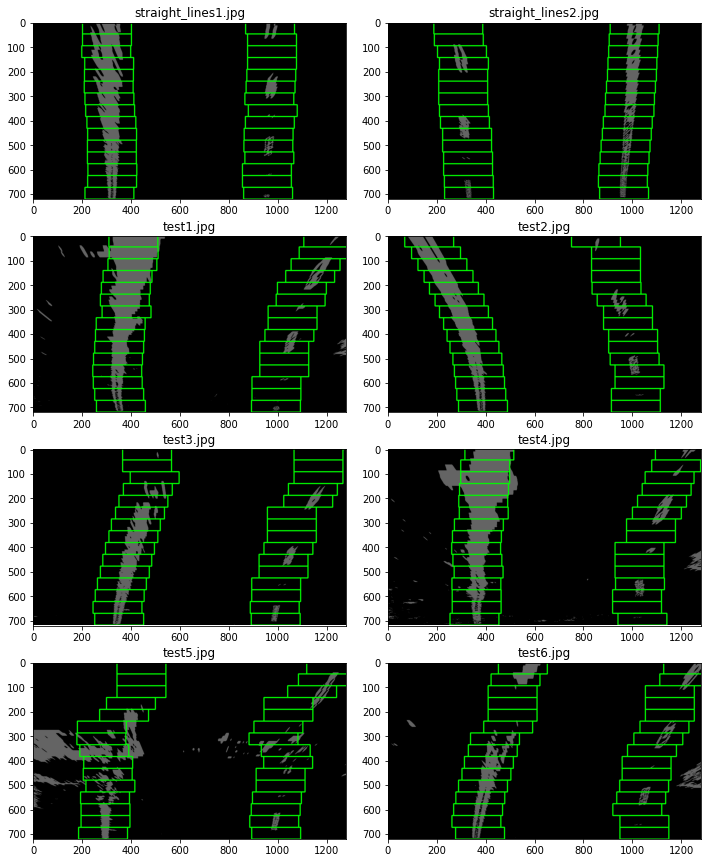

In [28]:
def find_windows(binary_image):   
    # Find starting point
    height, width = binary_image.shape
    histogram = calculate_histogram(binary_image)
    mid_point = width // 2
    current_left_line_idx = np.argmax(histogram[:mid_point])
    current_right_line_idx = np.argmax(histogram[mid_point:]) + mid_point
    
    # Set hyperparameters
    num_windows = 15
    window_width= 200
    minpix_density = 0.002
    window_height = height // num_windows
    
    # Create multiple window moving upwards
    l_windows = []
    r_windows = []
    for i in range(num_windows):        
        # Window position
        window_bottom_height = height - i * window_height
        window_top_height = height - (i + 1) * window_height
        
        left_window_left = current_left_line_idx - window_width // 2
        left_window_right = current_left_line_idx + window_width // 2

        right_window_left = current_right_line_idx - window_width // 2
        right_window_right = current_right_line_idx + window_width // 2

        left_window_corners = [[left_window_left, window_top_height],
                               [left_window_right, window_top_height],
                               [left_window_left, window_bottom_height],
                               [left_window_right, window_bottom_height]]

        right_window_corners = [[right_window_left, window_top_height],
                                [right_window_right, window_top_height],
                                [right_window_left, window_bottom_height],
                                [right_window_right, window_bottom_height]]
        
        if window_top_height < 0:
            window_top_height = 0
        if left_window_left < 0:
            left_window_left = 0
        if right_window_right >= width:
            right_window_right = width
            
        left_window = binary_image[window_top_height:window_bottom_height, left_window_left:left_window_right]
        right_window = binary_image[window_top_height:window_bottom_height, right_window_left:right_window_right]
        
        def find_median_index(window):
            import statistics 
            x_indices = []
            for y in range(len(window)):
                for x in range(len(window[0])):
                    if window[y][x] == 1:
                        x_indices.append(x)
            return int(statistics.median(x_indices))
                        
        # Do not move window if few pixels are found
        minpix_left = minpix_density * left_window.shape[0] * left_window.shape[1]
        minpix_right = minpix_density * right_window.shape[0] * right_window.shape[1]
        if np.sum(left_window) >= minpix_left:
            current_left_line_idx = find_median_index(left_window) + left_window_left
        if np.sum(right_window) >= minpix_right:
            current_right_line_idx = find_median_index(right_window) + right_window_left

        # Store window
        l_windows.append(left_window_corners)
        r_windows.append(right_window_corners)
        
    return l_windows, r_windows

def _visualize_boxes():
    def add_boxes(binary_image, windows):
        rgb_image = cv2.cvtColor(binary_image, cv2.COLOR_GRAY2RGB) * 100
        for w in windows:
            rgb_image = cv2.rectangle(rgb_image, (int(w[0][0]), int(w[0][1])), (int(w[3][0]), int(w[3][1])), (0, 255, 0) ,3)
        return rgb_image
    
    fixed_images = [process_image(img) for img in LANE_LINE_IMAGES]
    l_windows_list = []
    r_windows_list = []
    for img in fixed_images:
        l_windows, r_windows = find_windows(img)
        l_windows_list.append(l_windows)
        r_windows_list.append(r_windows)
    
    images = []
    for i in range(len(l_windows_list)):
        images.append(add_boxes(fixed_images[i], l_windows_list[i] + r_windows_list[i]))
    
    display_images(images, LANE_LINE_IMAGE_FILE_NAMES)
    
_visualize_boxes()

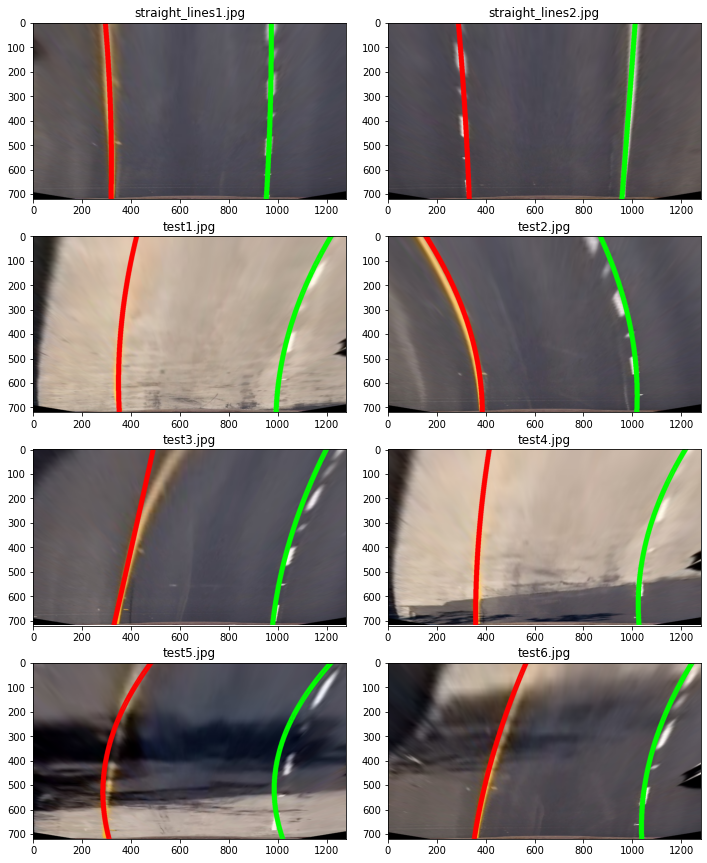

In [29]:
def fit_polynomial_with_windows(l_windows, r_windows):
    def boxes_to_xy(windows):
        x_list = []
        y_list = []
        for window in windows:
            x_left = window[0][0]
            x_right = window[1][0]
            y_top = window[0][1]
            y_bottom = window[2][1]

            x_list.append((x_left + x_right) // 2)
            y_list.append((y_top + y_bottom) // 2)

        return x_list, y_list
    x_list_left, y_list_left = boxes_to_xy(l_windows)
    x_list_right, y_list_right = boxes_to_xy(r_windows)
    
    left_fit = np.polyfit(y_list_left, x_list_left, 2)
    right_fit = np.polyfit(y_list_right, x_list_right, 2)
    
    return left_fit, right_fit

def polynomial_to_line(binary_image, left_fit, right_fit):
    height = binary_image.shape[0]
    ploty = np.linspace(0, height-1, height)
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
        
    return ploty, left_fitx, right_fitx

def add_lines(rgb_image):
    binary_image = process_image(rgb_image)
    l_windows, r_windows = find_windows(binary_image)
    left_fit, right_fit = fit_polynomial_with_windows(l_windows, r_windows)
    ploty, left_fitx, right_fitx = polynomial_to_line(binary_image, left_fit, right_fit)

    copy_rgb_image = undistort_and_perspective(rgb_image.copy())
    for i in range(len(ploty)):
        cv2.circle(copy_rgb_image, (int(left_fitx[i]), int(ploty[i])), radius=10, color=(255, 0, 0), thickness=1)
        cv2.circle(copy_rgb_image, (int(right_fitx[i]), int(ploty[i])), radius=10, color=(0, 255, 0), thickness=1)

    return copy_rgb_image

def _visualize_polynomial_fit_with_windows():    
    images = [add_lines(img) for img in LANE_LINE_IMAGES]
    display_images(images, LANE_LINE_IMAGE_FILE_NAMES)
    
_visualize_polynomial_fit_with_windows()

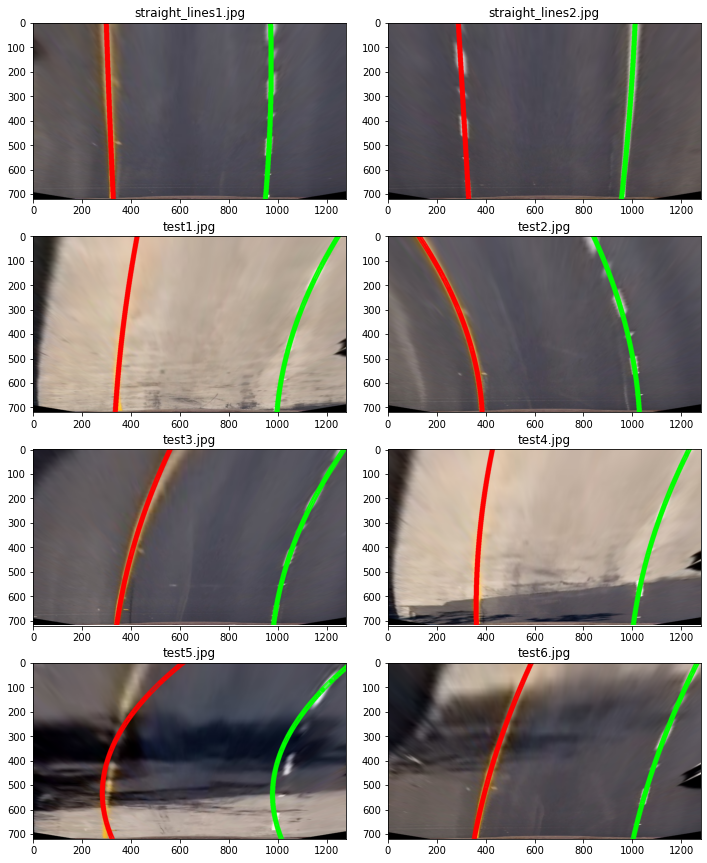

In [30]:
def fit_polynomial_with_lines(binary_image, left_fit, right_fit):
    margin = 100
    nonzero = binary_image.nonzero()
    nonzeroy, nonzerox = np.array(nonzero[0]), np.array(nonzero[1])
    
    # Find indices of non zero pixels within margin of lines
    left_lane_inds = (np.argwhere((nonzerox > left_fit[0]*nonzeroy**2 + left_fit[1]*nonzeroy + left_fit[2] - margin)
                                 & ((nonzerox < left_fit[0]*nonzeroy**2 + left_fit[1]*nonzeroy + left_fit[2] + margin)))
                      .flatten())
    
    right_lane_inds = (np.argwhere((nonzerox > right_fit[0]*nonzeroy**2 + right_fit[1]*nonzeroy + right_fit[2] - margin)
                                 & ((nonzerox < right_fit[0]*nonzeroy**2 + right_fit[1]*nonzeroy + right_fit[2] + margin)))
                      .flatten())
    
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit the points
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    return left_fit, right_fit
    
def add_lines_with_lines(rgb_image, old_left_fit, old_right_fit):
    binary_image = process_image(rgb_image)
    left_fit, right_fit = fit_polynomial_with_lines(binary_image, old_left_fit, old_right_fit)
    ploty, left_fitx, right_fitx = polynomial_to_line(binary_image, left_fit, right_fit)

    copy_rgb_image = undistort_and_perspective(rgb_image.copy())
    for i in range(len(ploty)):
        cv2.circle(copy_rgb_image, (int(left_fitx[i]), int(ploty[i])), radius=10, color=(255, 0, 0), thickness=1)
        cv2.circle(copy_rgb_image, (int(right_fitx[i]), int(ploty[i])), radius=10, color=(0, 255, 0), thickness=1)

    return copy_rgb_image

def _visualize_polynomial_fit_with_lines():    
    left_fits, right_fits = [], []
    for img in LANE_LINE_IMAGES:
        binary_image = process_image(img)
        l_windows, r_windows = find_windows(binary_image)
        left_fit, right_fit = fit_polynomial_with_windows(l_windows, r_windows)
        left_fits.append(left_fit)
        right_fits.append(right_fit)

    images = [add_lines_with_lines(LANE_LINE_IMAGES[i], left_fits[i], right_fits[i]) for i in range(len(LANE_LINE_IMAGES))]
    display_images(images, LANE_LINE_IMAGE_FILE_NAMES)
    
_visualize_polynomial_fit_with_lines()

## Calculate Radius of Curvature and Position

The left radius of curvature is 1206.6800438639423 pixels.
The right radius of curvature is 643.7126480399511 pixels.
Position wrt center is 33.4349971719455 pixels left.


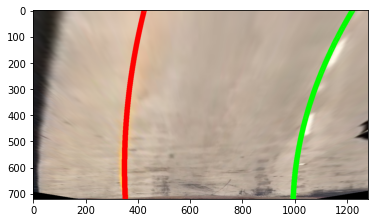

In [31]:
def radius_of_curvature_px(fit, y_eval):
    A, B, C = fit
    return (1 + (2*A*y_eval + B)**2)**3/2 / abs(2*A)

def position_of_center_px(left_fit, right_fit, y_eval):
    left_line_pos = left_fit[0]*y_eval**2 + left_fit[1]*y_eval + left_fit[2]
    right_line_pos = right_fit[0]*y_eval**2 + right_fit[1]*y_eval + right_fit[2]
    
    center_of_lines = (left_line_pos + right_line_pos) / 2
    return center_of_lines

def position_wrt_center_px(binary_image, left_fit, right_fit):
    y_eval = binary_image.shape[0]
    center_of_lines = position_of_center_px(left_fit, right_fit, y_eval)
    car_position = binary_image.shape[1] / 2
    
    return car_position - center_of_lines

def _test_radius_of_curvature_and_position_px(rgb_image):
    binary_image = process_image(rgb_image)
    l_windows, r_windows = find_windows(binary_image)
    left_fit, right_fit = fit_polynomial_with_windows(l_windows, r_windows)
    y_eval = binary_image.shape[0]
    print("The left radius of curvature is {} pixels.".format(radius_of_curvature_px(left_fit, y_eval)))
    print("The right radius of curvature is {} pixels.".format(radius_of_curvature_px(right_fit, y_eval)))
    position = position_wrt_center_px(rgb_image, left_fit, right_fit)
    print("Position wrt center is {} pixels {}.".format(abs(position), "right" if position > 0 else "left"))
    plt.imshow(add_lines(rgb_image))
    
_test_radius_of_curvature_and_position_px(LANE_LINE_IMAGES[2])

The left radius of curvature is 189.4136333399536 m.
The right radius of curvature is 101.4156670372571 m.
Position wrt center is 0.19032229159415132 m left.


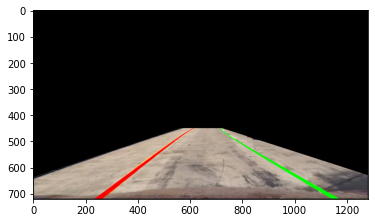

In [32]:
X_M_PER_PIXEL = 3.7 / 650  # Lane lines are about 3.7m wide. 650 pixels wide in images above
Y_M_PER_PIXEL = 3 / 100    # Dashed lane lines are about 3m long. 100 pixels long in images above.

def radius_of_curvature_m(fit, y_eval):
    A, B, C = fit
    A = A * X_M_PER_PIXEL / Y_M_PER_PIXEL**2
    B = B * X_M_PER_PIXEL / Y_M_PER_PIXEL
    C = C * X_M_PER_PIXEL
    y_eval = y_eval * Y_M_PER_PIXEL
    return (1 + (2*A*y_eval + B)**2)**3/2 / abs(2*A)

def position_wrt_center_m(binary_image, left_fit, right_fit):
    y_eval = binary_image.shape[0]
    center_of_lines = position_of_center_px(left_fit, right_fit, y_eval)
    car_position = binary_image.shape[1] / 2
    
    return (car_position - center_of_lines) * X_M_PER_PIXEL

def _test_radius_of_curvature_and_position_px(rgb_image):
    binary_image = process_image(rgb_image)
    l_windows, r_windows = find_windows(binary_image)
    left_fit, right_fit = fit_polynomial_with_windows(l_windows, r_windows)
    y_eval = binary_image.shape[0]
    print("The left radius of curvature is {} m.".format(radius_of_curvature_m(left_fit, y_eval)))
    print("The right radius of curvature is {} m.".format(radius_of_curvature_m(right_fit, y_eval)))
    position = position_wrt_center_m(rgb_image, left_fit, right_fit)
    print("Position wrt center is {} m {}.".format(abs(position), "right" if position > 0 else "left"))
    plt.imshow(inverse_perspective(add_lines(rgb_image)))

_test_radius_of_curvature_and_position_px(LANE_LINE_IMAGES[2])

First time!


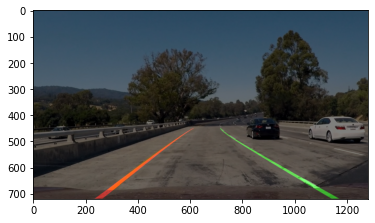

In [41]:
def full_process_image(rgb_image):
    def my_add_lines(rgb_image):
        binary_image = process_image(rgb_image)
        l_windows, r_windows = find_windows(binary_image)
        left_fit, right_fit = fit_polynomial_with_windows(l_windows, r_windows)
        ploty, left_fitx, right_fitx = polynomial_to_line(binary_image, left_fit, right_fit)

        copy_rgb_image = np.zeros_like(rgb_image)
        for i in range(len(ploty)):
            cv2.circle(copy_rgb_image, (int(left_fitx[i]), int(ploty[i])), radius=10, color=(255, 0, 0), thickness=1)
            cv2.circle(copy_rgb_image, (int(right_fitx[i]), int(ploty[i])), radius=10, color=(0, 255, 0), thickness=1)

        return copy_rgb_image
    
    def my_add_lines_with_lines(rgb_image, old_left_fit, old_right_fit):
        binary_image = process_image(rgb_image)
        left_fit, right_fit = fit_polynomial_with_lines(binary_image, old_left_fit, old_right_fit)
        ploty, left_fitx, right_fitx = polynomial_to_line(binary_image, left_fit, right_fit)

        copy_rgb_image = np.zeros_like(rgb_image)
        for i in range(len(ploty)):
            cv2.circle(copy_rgb_image, (int(left_fitx[i]), int(ploty[i])), radius=10, color=(255, 0, 0), thickness=1)
            cv2.circle(copy_rgb_image, (int(right_fitx[i]), int(ploty[i])), radius=10, color=(0, 255, 0), thickness=1)

        return copy_rgb_image

    binary_image = process_image(rgb_image)
    try:
        left_fit, right_fit = fit_polynomial_with_lines(binary_image, full_process_image.left_fit, full_process_image.right_fit)
        print("after first")
    except:
        print("First time!")
        l_windows, r_windows = find_windows(binary_image)
        left_fit, right_fit = fit_polynomial_with_windows(l_windows, r_windows)

    full_process_image.left_fit = left_fit
    full_process_image.right_fit = right_fit
    y_eval = binary_image.shape[0]
#     print("The left radius of curvature is {} m.".format(radius_of_curvature_m(left_fit, y_eval)))
#     print("The right radius of curvature is {} m.".format(radius_of_curvature_m(right_fit, y_eval)))
    position = position_wrt_center_m(rgb_image, left_fit, right_fit)
#     print("Position wrt center is {} m {}.".format(abs(position), "right" if position > 0 else "left"))
    final_image = cv2.addWeighted(inverse_perspective(my_add_lines(rgb_image)), 0.5, rgb_image, 0.5, 0)
    return final_image

plt.imshow(full_process_image(LANE_LINE_IMAGES[2]))

## Process Videos

In [34]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [42]:
# PROJECT_VIDEO = VideoFileClip("test_videos/project_video.mp4")
PROJECT_VIDEO = VideoFileClip("test_videos/project_video.mp4").subclip(0,5)
PROCESSED_PROJECT_VIDEO_2 = PROJECT_VIDEO.fl_image(full_process_image) #NOTE: this function expects color images!!
%time PROCESSED_PROJECT_VIDEO_2.write_videofile('output_videos/project_video_2.mp4', audio=False)

after first


t:   0%|          | 0/125 [00:00<?, ?it/s, now=None]

Moviepy - Building video output_videos/project_video_2.mp4.
Moviepy - Writing video output_videos/project_video_2.mp4

after first


t:   2%|▏         | 2/125 [00:00<00:27,  4.44it/s, now=None]

after first


t:   2%|▏         | 3/125 [00:00<00:33,  3.60it/s, now=None]

after first


t:   3%|▎         | 4/125 [00:01<00:39,  3.09it/s, now=None]

after first


t:   4%|▍         | 5/125 [00:01<00:41,  2.93it/s, now=None]

after first


t:   5%|▍         | 6/125 [00:02<00:42,  2.79it/s, now=None]

after first


t:   6%|▌         | 7/125 [00:02<00:44,  2.68it/s, now=None]

after first


t:   6%|▋         | 8/125 [00:02<00:44,  2.60it/s, now=None]

after first


t:   7%|▋         | 9/125 [00:03<00:45,  2.55it/s, now=None]

after first


t:   8%|▊         | 10/125 [00:03<00:45,  2.54it/s, now=None]

after first


t:   9%|▉         | 11/125 [00:04<00:45,  2.48it/s, now=None]

after first


t:  10%|▉         | 12/125 [00:04<00:46,  2.45it/s, now=None]

after first


t:  10%|█         | 13/125 [00:04<00:45,  2.44it/s, now=None]

after first


t:  11%|█         | 14/125 [00:05<00:45,  2.45it/s, now=None]

after first


t:  12%|█▏        | 15/125 [00:05<00:44,  2.49it/s, now=None]

after first


t:  13%|█▎        | 16/125 [00:06<00:44,  2.47it/s, now=None]

after first


t:  14%|█▎        | 17/125 [00:06<00:43,  2.49it/s, now=None]

after first


t:  14%|█▍        | 18/125 [00:06<00:43,  2.48it/s, now=None]

after first


t:  15%|█▌        | 19/125 [00:07<00:42,  2.48it/s, now=None]

after first


t:  16%|█▌        | 20/125 [00:07<00:42,  2.46it/s, now=None]

after first


t:  17%|█▋        | 21/125 [00:08<00:42,  2.45it/s, now=None]

after first


t:  18%|█▊        | 22/125 [00:08<00:41,  2.47it/s, now=None]

after first


t:  18%|█▊        | 23/125 [00:08<00:41,  2.48it/s, now=None]

after first


t:  19%|█▉        | 24/125 [00:09<00:41,  2.44it/s, now=None]

after first


t:  20%|██        | 25/125 [00:09<00:41,  2.43it/s, now=None]

after first


t:  21%|██        | 26/125 [00:10<00:40,  2.43it/s, now=None]

after first


t:  22%|██▏       | 27/125 [00:10<00:40,  2.43it/s, now=None]

after first


t:  22%|██▏       | 28/125 [00:11<00:39,  2.45it/s, now=None]

after first


t:  23%|██▎       | 29/125 [00:11<00:39,  2.44it/s, now=None]

after first


t:  24%|██▍       | 30/125 [00:11<00:39,  2.43it/s, now=None]

after first


t:  25%|██▍       | 31/125 [00:12<00:37,  2.49it/s, now=None]

after first


t:  26%|██▌       | 32/125 [00:12<00:36,  2.53it/s, now=None]

after first


t:  26%|██▋       | 33/125 [00:13<00:35,  2.56it/s, now=None]

after first


t:  27%|██▋       | 34/125 [00:13<00:36,  2.50it/s, now=None]

after first


t:  28%|██▊       | 35/125 [00:13<00:35,  2.52it/s, now=None]

after first


t:  29%|██▉       | 36/125 [00:14<00:35,  2.48it/s, now=None]

after first


t:  30%|██▉       | 37/125 [00:14<00:34,  2.54it/s, now=None]

after first


t:  30%|███       | 38/125 [00:14<00:33,  2.58it/s, now=None]

after first


t:  31%|███       | 39/125 [00:15<00:33,  2.56it/s, now=None]

after first


t:  32%|███▏      | 40/125 [00:15<00:32,  2.62it/s, now=None]

after first


t:  33%|███▎      | 41/125 [00:16<00:32,  2.56it/s, now=None]

after first


t:  34%|███▎      | 42/125 [00:16<00:32,  2.57it/s, now=None]

after first


t:  34%|███▍      | 43/125 [00:16<00:32,  2.49it/s, now=None]

after first


t:  35%|███▌      | 44/125 [00:17<00:32,  2.52it/s, now=None]

after first


t:  36%|███▌      | 45/125 [00:17<00:30,  2.59it/s, now=None]

after first


t:  37%|███▋      | 46/125 [00:18<00:30,  2.62it/s, now=None]

after first


t:  38%|███▊      | 47/125 [00:18<00:29,  2.62it/s, now=None]

after first


t:  38%|███▊      | 48/125 [00:18<00:29,  2.59it/s, now=None]

after first


t:  39%|███▉      | 49/125 [00:19<00:29,  2.61it/s, now=None]

after first


t:  40%|████      | 50/125 [00:19<00:28,  2.66it/s, now=None]

after first


t:  41%|████      | 51/125 [00:19<00:28,  2.63it/s, now=None]

after first


t:  42%|████▏     | 52/125 [00:20<00:28,  2.58it/s, now=None]

after first


t:  42%|████▏     | 53/125 [00:20<00:27,  2.60it/s, now=None]

after first


t:  43%|████▎     | 54/125 [00:21<00:28,  2.53it/s, now=None]

after first


t:  44%|████▍     | 55/125 [00:21<00:27,  2.56it/s, now=None]

after first


t:  45%|████▍     | 56/125 [00:21<00:27,  2.51it/s, now=None]

after first


t:  46%|████▌     | 57/125 [00:22<00:27,  2.47it/s, now=None]

after first


t:  46%|████▋     | 58/125 [00:22<00:27,  2.47it/s, now=None]

after first


t:  47%|████▋     | 59/125 [00:23<00:27,  2.42it/s, now=None]

after first


t:  48%|████▊     | 60/125 [00:23<00:26,  2.49it/s, now=None]

after first


t:  49%|████▉     | 61/125 [00:24<00:26,  2.44it/s, now=None]

after first


t:  50%|████▉     | 62/125 [00:24<00:25,  2.49it/s, now=None]

after first


t:  50%|█████     | 63/125 [00:24<00:25,  2.48it/s, now=None]

after first


t:  51%|█████     | 64/125 [00:25<00:24,  2.48it/s, now=None]

after first


t:  52%|█████▏    | 65/125 [00:25<00:23,  2.51it/s, now=None]

after first


t:  53%|█████▎    | 66/125 [00:26<00:23,  2.49it/s, now=None]

after first


t:  54%|█████▎    | 67/125 [00:26<00:23,  2.48it/s, now=None]

after first


t:  54%|█████▍    | 68/125 [00:26<00:23,  2.48it/s, now=None]

after first


t:  55%|█████▌    | 69/125 [00:27<00:22,  2.52it/s, now=None]

after first


t:  56%|█████▌    | 70/125 [00:27<00:21,  2.51it/s, now=None]

after first


t:  57%|█████▋    | 71/125 [00:28<00:22,  2.42it/s, now=None]

after first


t:  58%|█████▊    | 72/125 [00:28<00:21,  2.48it/s, now=None]

after first


t:  58%|█████▊    | 73/125 [00:28<00:20,  2.49it/s, now=None]

after first


t:  59%|█████▉    | 74/125 [00:29<00:20,  2.43it/s, now=None]

after first


t:  60%|██████    | 75/125 [00:29<00:20,  2.45it/s, now=None]

after first


t:  61%|██████    | 76/125 [00:30<00:20,  2.41it/s, now=None]

after first


t:  62%|██████▏   | 77/125 [00:30<00:19,  2.50it/s, now=None]

after first


t:  62%|██████▏   | 78/125 [00:30<00:18,  2.52it/s, now=None]

after first


t:  63%|██████▎   | 79/125 [00:31<00:18,  2.51it/s, now=None]

after first


t:  64%|██████▍   | 80/125 [00:31<00:18,  2.49it/s, now=None]

after first


t:  65%|██████▍   | 81/125 [00:32<00:17,  2.51it/s, now=None]

after first


t:  66%|██████▌   | 82/125 [00:32<00:17,  2.49it/s, now=None]

after first


t:  66%|██████▋   | 83/125 [00:32<00:16,  2.52it/s, now=None]

after first


t:  67%|██████▋   | 84/125 [00:33<00:16,  2.44it/s, now=None]

after first


t:  68%|██████▊   | 85/125 [00:33<00:16,  2.44it/s, now=None]

after first


t:  69%|██████▉   | 86/125 [00:34<00:15,  2.52it/s, now=None]

after first


t:  70%|██████▉   | 87/125 [00:34<00:14,  2.55it/s, now=None]

after first


t:  70%|███████   | 88/125 [00:34<00:14,  2.54it/s, now=None]

after first


t:  71%|███████   | 89/125 [00:35<00:14,  2.51it/s, now=None]

after first


t:  72%|███████▏  | 90/125 [00:35<00:13,  2.53it/s, now=None]

after first


t:  73%|███████▎  | 91/125 [00:36<00:13,  2.55it/s, now=None]

after first


t:  74%|███████▎  | 92/125 [00:36<00:13,  2.49it/s, now=None]

after first


t:  74%|███████▍  | 93/125 [00:36<00:13,  2.44it/s, now=None]

after first


t:  75%|███████▌  | 94/125 [00:37<00:12,  2.41it/s, now=None]

after first


t:  76%|███████▌  | 95/125 [00:37<00:12,  2.41it/s, now=None]

after first


t:  77%|███████▋  | 96/125 [00:38<00:12,  2.38it/s, now=None]

after first


t:  78%|███████▊  | 97/125 [00:38<00:11,  2.36it/s, now=None]

after first


t:  78%|███████▊  | 98/125 [00:39<00:11,  2.39it/s, now=None]

after first


t:  79%|███████▉  | 99/125 [00:39<00:10,  2.40it/s, now=None]

after first


t:  80%|████████  | 100/125 [00:39<00:10,  2.42it/s, now=None]

after first


t:  81%|████████  | 101/125 [00:40<00:10,  2.40it/s, now=None]

after first


t:  82%|████████▏ | 102/125 [00:40<00:09,  2.43it/s, now=None]

after first


t:  82%|████████▏ | 103/125 [00:41<00:08,  2.47it/s, now=None]

after first


t:  83%|████████▎ | 104/125 [00:41<00:08,  2.45it/s, now=None]

after first


t:  84%|████████▍ | 105/125 [00:41<00:07,  2.51it/s, now=None]

after first


t:  85%|████████▍ | 106/125 [00:42<00:07,  2.53it/s, now=None]

after first


t:  86%|████████▌ | 107/125 [00:42<00:07,  2.52it/s, now=None]

after first


t:  86%|████████▋ | 108/125 [00:43<00:06,  2.49it/s, now=None]

after first


t:  87%|████████▋ | 109/125 [00:43<00:06,  2.47it/s, now=None]

after first


t:  88%|████████▊ | 110/125 [00:43<00:06,  2.43it/s, now=None]

after first


t:  89%|████████▉ | 111/125 [00:44<00:05,  2.47it/s, now=None]

after first


t:  90%|████████▉ | 112/125 [00:44<00:05,  2.41it/s, now=None]

after first


t:  90%|█████████ | 113/125 [00:45<00:04,  2.46it/s, now=None]

after first


t:  91%|█████████ | 114/125 [00:45<00:04,  2.41it/s, now=None]

after first


t:  92%|█████████▏| 115/125 [00:45<00:04,  2.44it/s, now=None]

after first


t:  93%|█████████▎| 116/125 [00:46<00:03,  2.43it/s, now=None]

after first


t:  94%|█████████▎| 117/125 [00:46<00:03,  2.42it/s, now=None]

after first


t:  94%|█████████▍| 118/125 [00:47<00:02,  2.49it/s, now=None]

after first


t:  95%|█████████▌| 119/125 [00:47<00:02,  2.49it/s, now=None]

after first


t:  96%|█████████▌| 120/125 [00:47<00:01,  2.56it/s, now=None]

after first


t:  97%|█████████▋| 121/125 [00:48<00:01,  2.59it/s, now=None]

after first


t:  98%|█████████▊| 122/125 [00:48<00:01,  2.53it/s, now=None]

after first


t:  98%|█████████▊| 123/125 [00:49<00:00,  2.54it/s, now=None]

after first


t:  99%|█████████▉| 124/125 [00:49<00:00,  2.46it/s, now=None]

after first


t: 100%|██████████| 125/125 [00:49<00:00,  2.50it/s, now=None]

after first


Moviepy - Done !
Moviepy - video ready output_videos/project_video_2.mp4
CPU times: user 1min 25s, sys: 1.48 s, total: 1min 26s
Wall time: 50.6 s


In [35]:
PROJECT_VIDEO = VideoFileClip("test_videos/project_video.mp4")
# PROJECT_VIDEO = VideoFileClip("test_videos/project_video.mp4").subclip(0,5)
PROCESSED_PROJECT_VIDEO = PROJECT_VIDEO.fl_image(full_process_image) #NOTE: this function expects color images!!
%time PROCESSED_PROJECT_VIDEO.write_videofile('output_videos/project_video.mp4', audio=False)

t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None]

Moviepy - Building video output_videos/project_video.mp4.
Moviepy - Writing video output_videos/project_video.mp4



Moviepy - Done !
Moviepy - video ready output_videos/project_video.mp4
CPU times: user 20min 59s, sys: 2.74 s, total: 21min 2s
Wall time: 15min 3s


In [ ]:
# CHALLENGE_VIDEO = VideoFileClip("test_videos/challenge_video.mp4")
CHALLENGE_VIDEO = VideoFileClip("test_videos/challenge_video.mp4").subclip(0,5)
PROCESSED_CHALLENGE_VIDEO = CHALLENGE_VIDEO.fl_image(full_process_image) #NOTE: this function expects color images!!
%time PROCESSED_CHALLENGE_VIDEO.write_videofile('output_videos/challenge_video_2.mp4', audio=False)

t:   0%|          | 0/150 [00:00<?, ?it/s, now=None]

after first
Moviepy - Building video output_videos/challenge_video_2.mp4.
Moviepy - Writing video output_videos/challenge_video_2.mp4

after first


t:   2%|▏         | 3/150 [00:00<00:20,  7.10it/s, now=None]

after first
after first


t:   3%|▎         | 5/150 [00:00<00:19,  7.35it/s, now=None]

after first
after first


t:   5%|▍         | 7/150 [00:00<00:19,  7.31it/s, now=None]

after first
after first


t:   6%|▌         | 9/150 [00:01<00:18,  7.63it/s, now=None]

after first
after first


t:   8%|▊         | 12/150 [00:01<00:16,  8.21it/s, now=None]

after first
after first


t:   9%|▊         | 13/150 [00:01<00:15,  8.56it/s, now=None]

after first
after first


t:  10%|█         | 15/150 [00:01<00:16,  8.18it/s, now=None]

after first
after first


t:  11%|█▏        | 17/150 [00:02<00:18,  7.11it/s, now=None]

after first
after first


t:  13%|█▎        | 19/150 [00:02<00:18,  7.05it/s, now=None]

after first
after first


t:  14%|█▍        | 21/150 [00:02<00:17,  7.19it/s, now=None]

after first
after first


t:  15%|█▌        | 23/150 [00:03<00:16,  7.77it/s, now=None]

after first
after first


t:  17%|█▋        | 25/150 [00:03<00:15,  8.12it/s, now=None]

after first
after first


t:  18%|█▊        | 27/150 [00:03<00:15,  8.11it/s, now=None]

after first
after first


t:  19%|█▉        | 29/150 [00:03<00:15,  7.60it/s, now=None]

after first
after first


t:  21%|██        | 31/150 [00:04<00:15,  7.64it/s, now=None]

after first
after first


t:  22%|██▏       | 33/150 [00:04<00:17,  6.58it/s, now=None]

after first
after first


t:  23%|██▎       | 35/150 [00:04<00:16,  6.85it/s, now=None]

after first
after first


t:  25%|██▍       | 37/150 [00:05<00:17,  6.59it/s, now=None]

after first
after first


t:  26%|██▌       | 39/150 [00:05<00:16,  6.60it/s, now=None]

after first
after first


t:  27%|██▋       | 41/150 [00:05<00:15,  7.01it/s, now=None]

after first
after first


t:  29%|██▊       | 43/150 [00:05<00:15,  6.79it/s, now=None]

after first
after first


t:  30%|███       | 45/150 [00:06<00:15,  6.67it/s, now=None]

after first
after first


t:  31%|███▏      | 47/150 [00:06<00:14,  6.92it/s, now=None]

after first
after first


t:  33%|███▎      | 49/150 [00:06<00:14,  7.16it/s, now=None]

after first
after first


t:  35%|███▍      | 52/150 [00:07<00:11,  8.43it/s, now=None]

after first
after first


t:  35%|███▌      | 53/150 [00:07<00:11,  8.12it/s, now=None]

after first
after first


t:  37%|███▋      | 56/150 [00:07<00:10,  8.76it/s, now=None]

after first
after first


t:  38%|███▊      | 57/150 [00:07<00:12,  7.63it/s, now=None]

after first
after first


t:  39%|███▊      | 58/150 [00:07<00:12,  7.58it/s, now=None]

In [ ]:
# HARDER_CHALLENGE_VIDEO = VideoFileClip("test_videos/harder_challenge_video.mp4")
HARDER_CHALLENGE_VIDEO = VideoFileClip("test_videos/harder_challenge_video.mp4").subclip(0,5)
PROCESSED_HARDER_CHALLENGE_VIDEO = HARDER_CHALLENGE_VIDEO.fl_image(full_process_image) #NOTE: this function expects color images!!
%time PROCESSED_HARDER_CHALLENGE_VIDEO.write_videofile('output_videos/harder_challenge_video_2.mp4', audio=False)